In [ ]:
# 0 
# 1 49 50 51 
# 2   83


In [110]:
import pandas as pd

# read a csv 
df = pd.read_csv("data/features.csv")
df.shape

(2474868, 3)

In [1]:
from src import utils_module
from src import preprocessing_module
import importlib

importlib.reload(utils_module)
df = utils_module.load_data( path_data="data/",
                name_csv_features="features.csv",
                name_csv_labels=None,
                delay=800000,
                labeled_data_step=2000000
                )

In [ ]:
                
importlib.reload(preprocessing_module)
data_arr = preprocessing_module.conver_datframe_to_numpy(df,
                        columns=["X", "Y", "Z"],
                        debug=True,
                        traking=True)                        


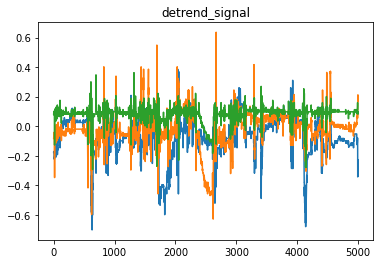

In [172]:
from src import preprocessing_module
import importlib

importlib.reload(preprocessing_module)
detrend = preprocessing_module.detrend_signal(   data_arr,
                                                traking=True, 
                                                viz=True, 
                                                start=50000, 
                                                end=55000)

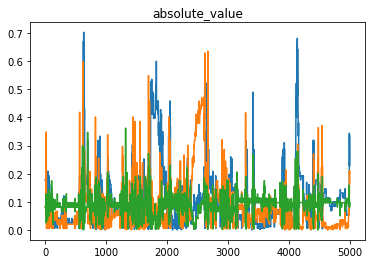

In [173]:
from src import preprocessing_module
import importlib

# reload the module
importlib.reload(preprocessing_module)
absolute_value = preprocessing_module.absolute_value(   detrend,
                                                traking=True,
                                                viz=True,
                                                start=50000,
                                                end=55000)
                                                

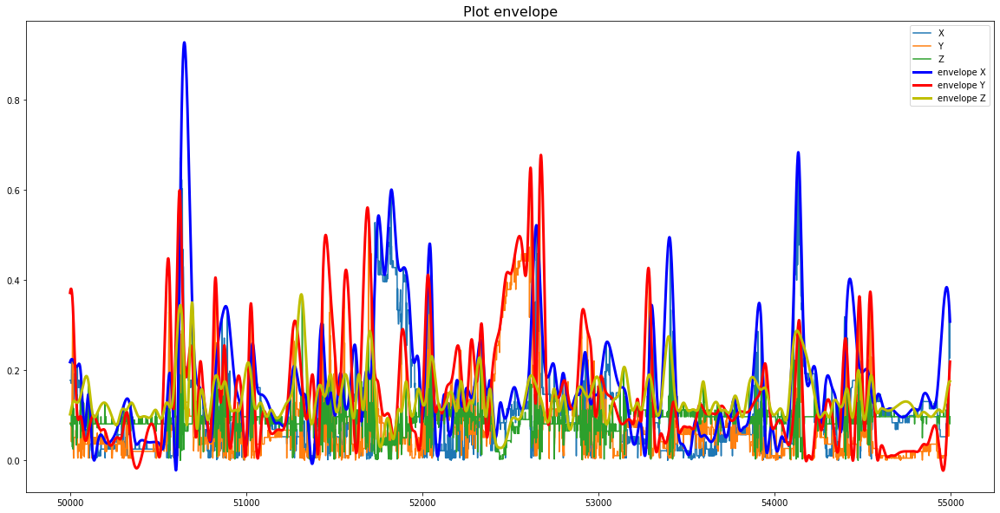

In [174]:
from src import preprocessing_module
import importlib  
import numpy as np  
import matplotlib.pyplot as plt

# Parameter interpolation ----------------------------------------------
interpolation = 20

importlib.reload(preprocessing_module)
data_eng = preprocessing_module.envelope(  
                                    absolute_value,
                                    # label_arr,
                                    interpolation=interpolation,
                                    traking=True,
                                    debug=False
                                    )

a = preprocessing_module.envelope_aux(absolute_value, interpolation)
x = np.arange(len(data_arr))

# Visualization interpolation  ----------------------------------------------
graph = True
start = 50000
end = 55000
if graph:
    # plot a
    plt.figure(figsize=(20,10))
    plt.title('Plot envelope',fontsize=16)
    plt.plot(x[start:end], absolute_value[start:end], label='envelope')
    plt.plot(x[start:end], a[0][start:end],color='b',linewidth=3)   
    plt.plot(x[start:end], a[1][start:end],color='r',linewidth=3)
    plt.plot(x[start:end], a[2][start:end],color='y',linewidth=3)
    # plt.plot(x[start:end], label_arr[start:end],color='black',linewidth=3)
    # legend column 1 is X, column 2 is Y, column 3 is Z
    plt.legend(['X', 'Y', 'Z','envelope X', 'envelope Y', 'envelope Z'], loc='upper right')
    plt.show()

In [176]:
from src import utils_module
import importlib

# reload the module
importlib.reload(utils_module)
# Data engineering ----------------------------------------------
names_new_columns = ['x_env','y_env','z_env']
df_interpolation = utils_module.arr_to_dataframe(data_eng, df, names_new_columns)
df_interpolation.head()

,X,Y,Z,x_env,y_env,z_env
0,-0.109,-0.188,0.016,0.000000,0.000000,0.000000
1,-0.124,-0.171,0.016,0.036361,0.004318,0.023561
2,-0.111,-0.158,0.014,0.069762,0.008265,0.044968
3,-0.123,-0.172,0.000,0.100315,0.011854,0.064306
4,-0.109,-0.172,0.002,0.128134,0.015101,0.081657


In [177]:
from src import preprocessing_module
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import importlib
import seaborn as sns
import warnings


# reload the module
importlib.reload(preprocessing_module)
# Norm data ----------------------------------------------
column_scale = ["x_env", "y_env", "z_env", 'X', 'Y', 'Z']
column_labels = ["label"]
df_sc = preprocessing_module.normalize_data( new_df,
                        columns_scale=column_scale, 
                        columns_labels=None, 
                        is_dataframe=True, 
                        type_normalization=MinMaxScaler,
                        # traking=False,
                        # debug=False
                        )
df_sc.head()


,x_env,y_env,z_env,X,Y,Z
0,0.090092,0.188255,0.237686,0.511719,0.480866,0.760481
1,0.105937,0.190151,0.243891,0.507212,0.485909,0.760481
2,0.120493,0.191884,0.249529,0.511118,0.489766,0.759969
3,0.133808,0.193461,0.254622,0.507512,0.485613,0.756391
4,0.145932,0.194887,0.259192,0.511719,0.485613,0.756902


In [178]:
import pandas as pd
from src import preprocessing_module
import importlib

# reload the module
importlib.reload(preprocessing_module)

df_sc.shape

# Data processing -------------------------------------------

interpolation = 20
arr_no_labeled = preprocessing_module.split_windows(
                                                        df_sc, 
                                                        exists_labels=False,
                                                        width_windows = interpolation, 
                                                        stride_windows = interpolation, 
                                                        debug=True
                                                        )



-----------------5--------whiteout label--------

 Number of windows with normal behavior :  83744 
 The shape of each window is :  (20, 6) 
 The shape of the array is :  (83744,) 
 The type of each window is :  <class 'numpy.ndarray'>


c:\Users\crist\Documents\Biology\QLA002 Panchito\V2\src\preprocessing_module.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(array)


In [95]:
arr_no_labeled = arr_no_labeled[:-1]
arr_no_labeled[-1].shape

(50, 6)

In [96]:
# verification all array have the same shape
for i in range(len(arr_no_labeled)):
    if arr_no_labeled[i].shape != (50, 6):
        print(i)
        print(arr_no_labeled[i].shape)


0
(18, 6)


In [97]:
# eliminate the last array
arr_no_labeled = arr_no_labeled[1:-1]
arr_no_labeled[0].shape

(50, 6)

In [99]:
# use stack to stack the arrays in sequence vertically (row wise).
arr_no_labeled_staked = np.stack(arr_no_labeled, axis=0)
arr_no_labeled_staked.shape

(37492, 50, 6)

In [104]:
# load h5 model
from tensorflow.keras.models import load_model
model = load_model('models/model50.h5')

# compile model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# 

In [105]:
# # arr_no_labeled = np.asarray(arr_no_labeled).astype('float32')

# # comvert arr_no_labeled to Tensor
import tensorflow as tf
t_no_labeled = tf.convert_to_tensor(arr_no_labeled_staked)


# make predictions
predictions = model.predict(t_no_labeled)

1172/1172 [==============================] - 5s 4ms/step


In [106]:
predictions.shape

(37492, 3)

In [116]:
predictions[1]

array([0.77223456, 0.01995607, 0.20780939], dtype=float32)

In [115]:

samples =2474868- 600150
samples/50

37494.36

In [117]:
type(predictions)

numpy.ndarray

In [123]:
data_arr.shape

(1874718, 3)

In [127]:
labels = []
for i in range(len(predictions)):
    labels.append(np.argmax(predictions[i]))

In [130]:
labels_extended = []

for element in labels:
    labels_extended.extend([element]*50)

print(len(labels_extended))

1874600


In [154]:
df.shape

(1874718, 3)

In [159]:
df = df[:1874600]


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>], dtype=object)

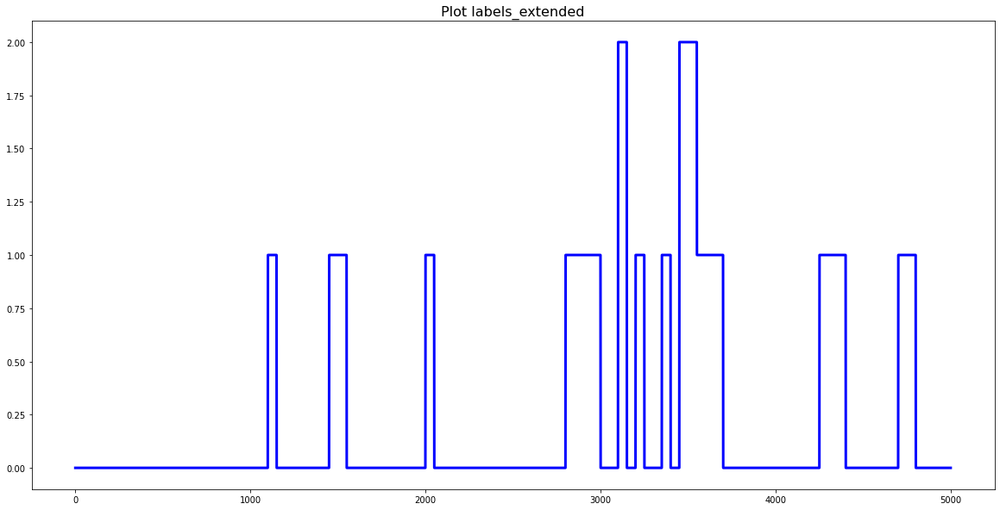

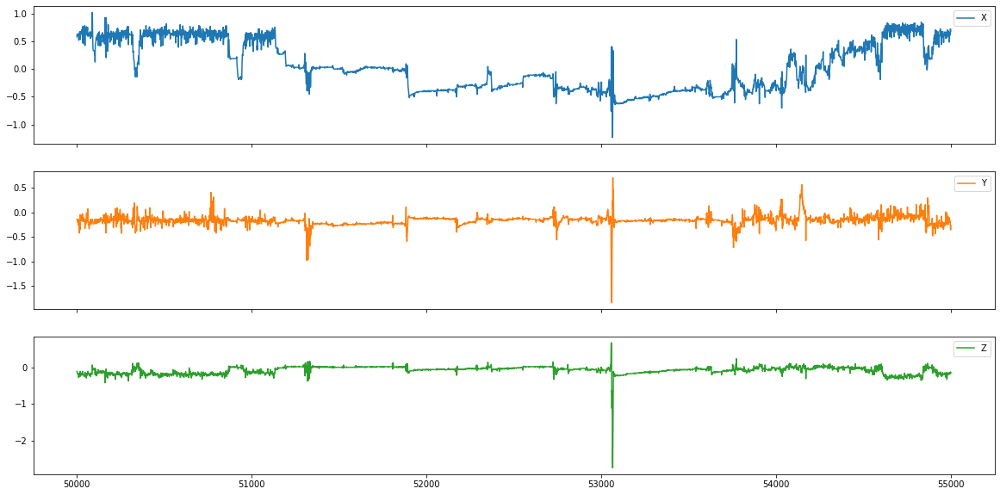

In [156]:
# plot labels_extended
import matplotlib.pyplot as plt
# from src import visualization_module
import importlib

# importlib.reload(visualization_module)

start = 50000
end = 55000

plt.figure(figsize=(20,10))
plt.title('Plot labels_extended',fontsize=16)
plt.plot(labels_extended[start:end],color='b',linewidth=3)
# plt.plot(data_arr[50000:55000],color='r',linewidth=3)
df[start:end].plot(subplots=True, figsize=(20,10))

In [160]:
# add column labels_extended to df
df['labels_extended'] = labels_extended
df.head()

C:\Users\crist\AppData\Local\Temp\ipykernel_15372\597398139.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['labels_extended'] = labels_extended


,X,Y,Z,labels_extended
0,-0.516,0.078,-0.062,0
1,-0.578,-0.047,-0.172,0
2,-0.656,-0.312,-0.188,0
3,-0.625,-0.172,-0.141,0
4,-0.672,-0.203,-0.203,0


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

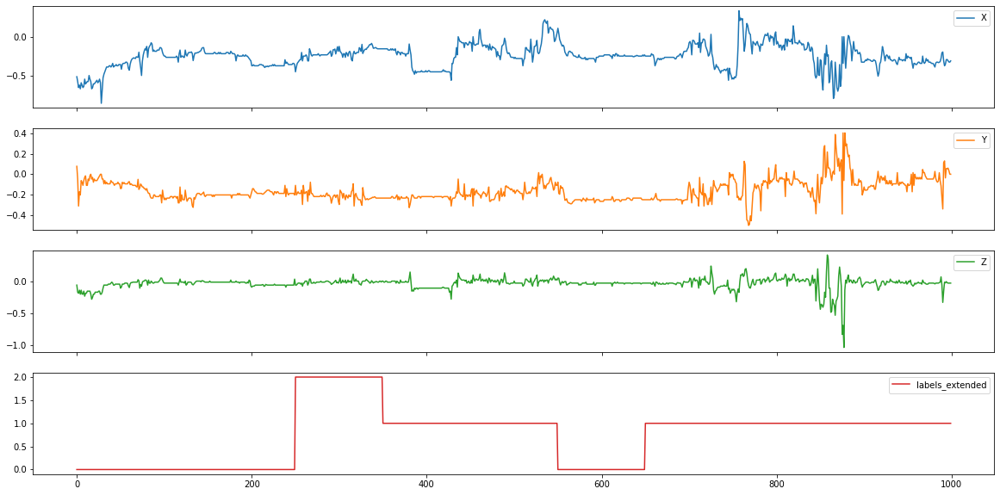

In [168]:
start = 0
end = 1000
df[start:end].plot(subplots=True, figsize=(20,10))

c:\Users\crist\miniconda3\envs\gpu_base\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


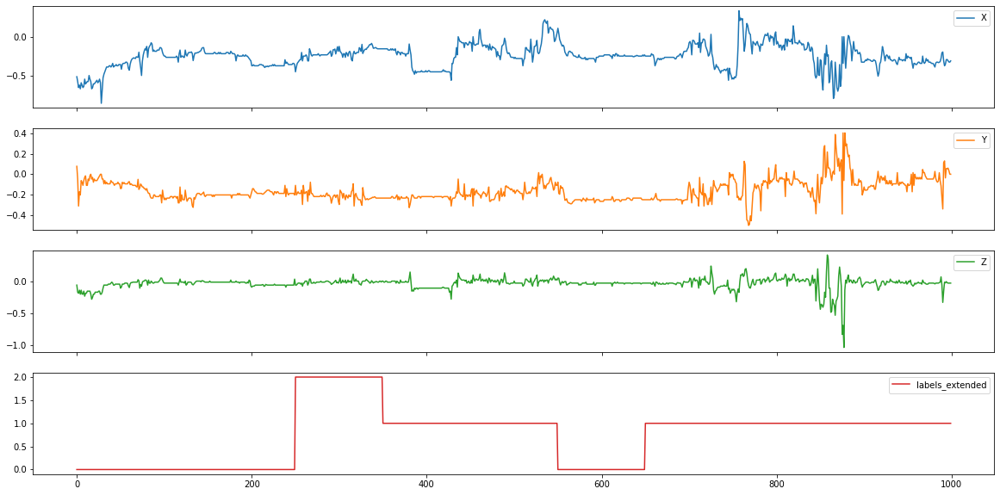

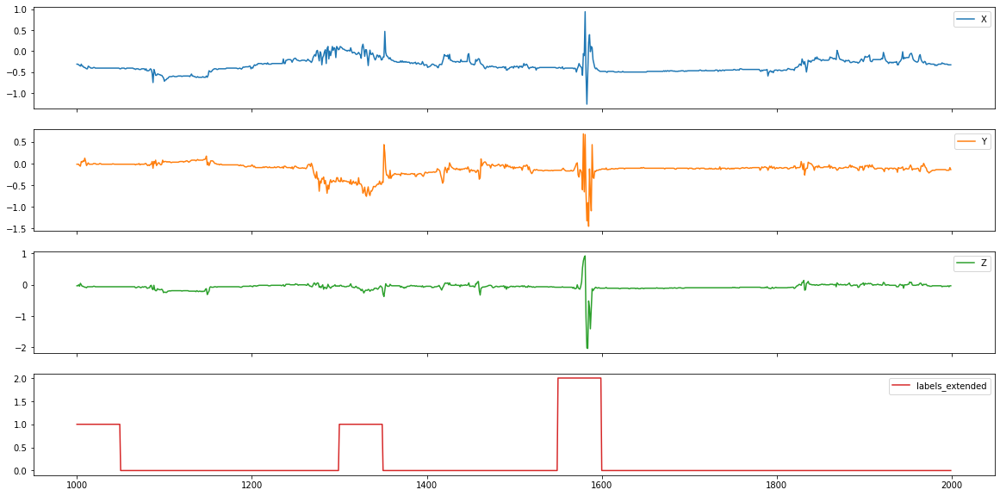

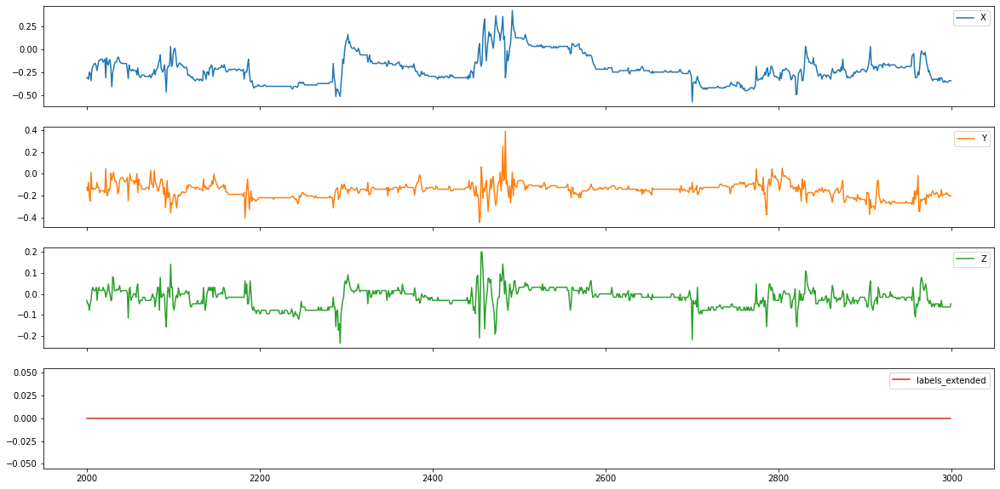

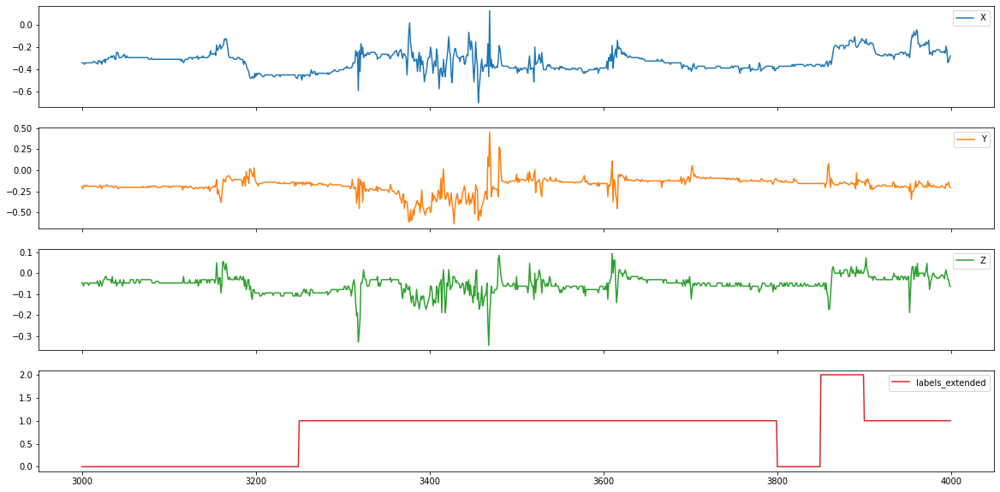

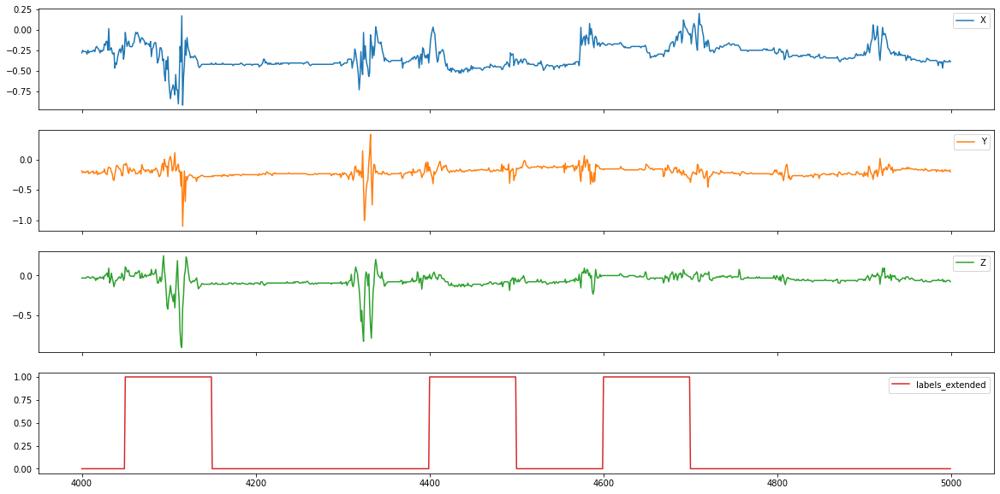

...

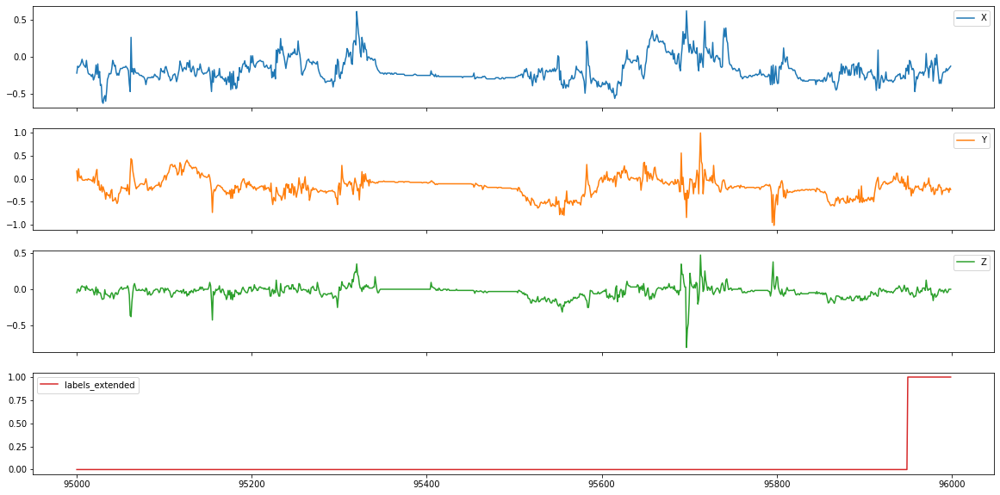

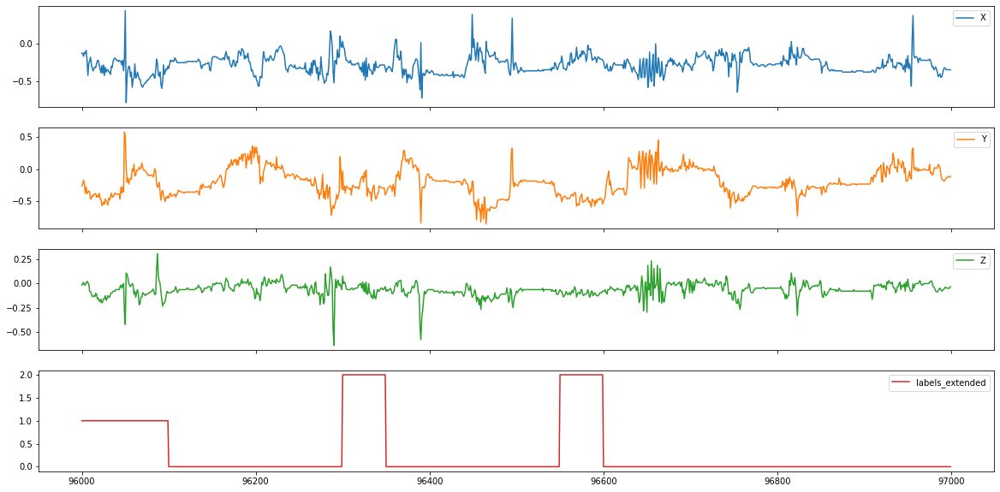

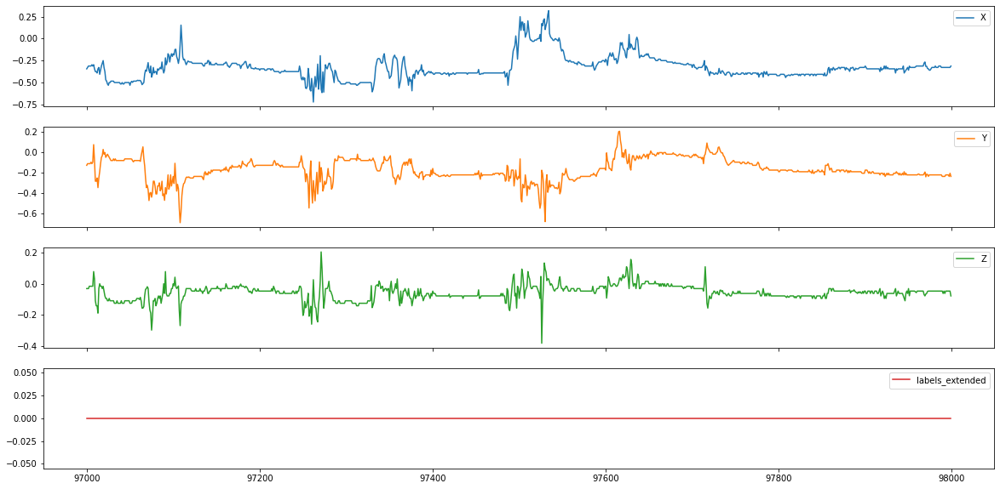

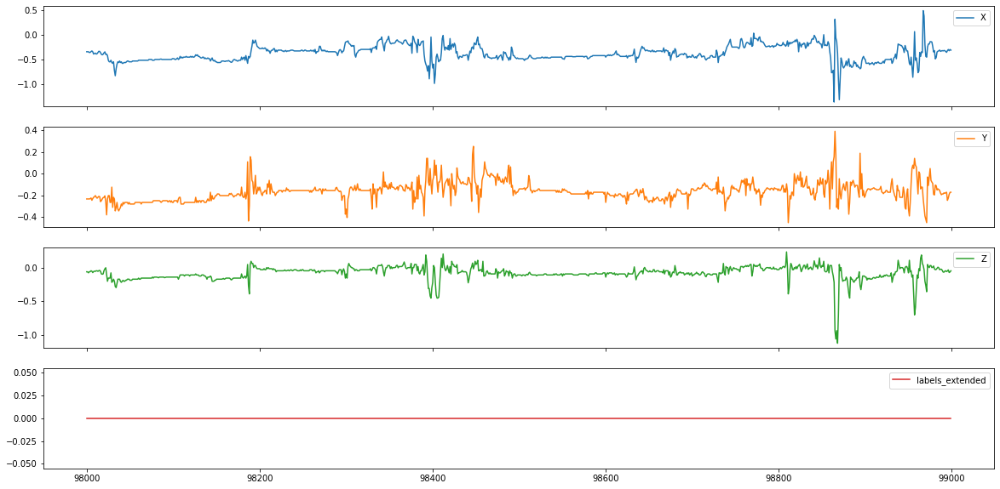

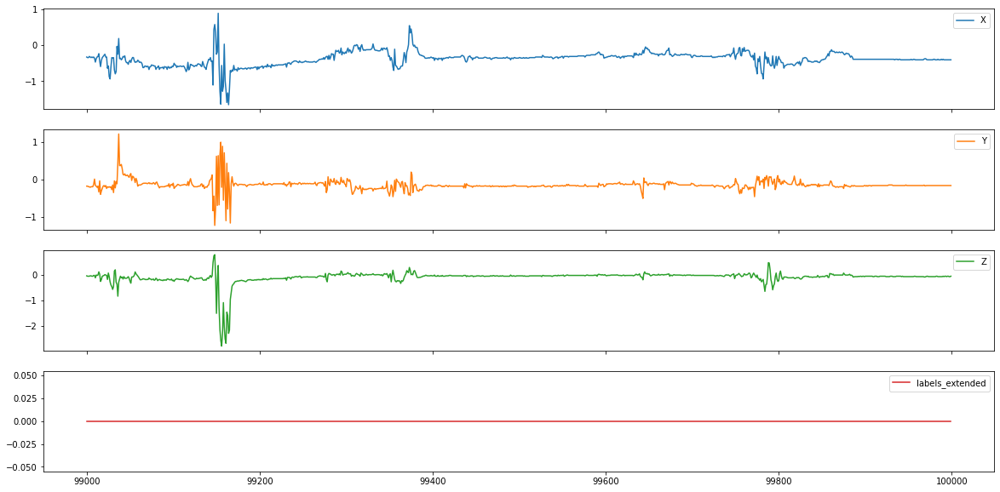

In [169]:
for i in range(100):
    paso = 1000
    df[i * paso : (i+1) * paso].plot(subplots=True, figsize=(20,10))